<a href="https://colab.research.google.com/github/cvbrandoe/coursHNS/blob/main/notebooks/ENC_HNS_geopandas_address.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Cours Humanités numériques spatialisées - Master HNC de PSL**


Traitement, enrichissement et cartographie de données tabulaires issues de l'Annuaire de propriétaires et de propriétés de Paris (1898).

**Objectifs**:
- utilisation de la bibliothèque pandas et geopandas pour la manipulation des données structurées (format tableur)
- geocodage des adresses (françaises) via l'API Adresse.gouv  
- cartographie des adresses et quartiers parisiens
- utiliser des opérations spatiales

*Notebook Carto tableur adresses parisiennes © 2023 by Carmen Brando is licensed under CC BY-NC-SA 4.0*


### **Présentation du contexte**


*Développement d'une chaine de traitement pour l'analyse de l'Annuaire des propriétaires et des propriétés de Paris et du département de la Seine (1898, 1903, 1913, 1923, 1951)*

Les annuaires et les répertoires anciens constituent une source riche d’information sur un moment précis de la géographie des villes historiques, mettant en rapport la distribution de l’espace avec des données socio-économiques ou professionnelles. L’un des plus célèbres parmi eux, l’Annuaire-Almanach du commerce Didot-Bottin est désormais accessible sur Gallica. Mais il existe d’autres annuaires socioprofessionnels ou mondains (comme Tout-Paris, Paris-mondain) qui restent enfouis dans les collections des bibliothèques sans avoir été jusqu’ici exploités dans leur intégralité. Nous nous intéressons à ce type de sources et souhaite particulièrement rendre accessible et interrogeable l’Annuaire des propriétaires et des propriétés de Paris et du département de la Seine, une publication annuelle active entre 1894 et 1937 et qui a repris après la guerre.


image source : https://paris-timemachine.huma-num.fr/web/wp-content/uploads/2019/08/image_annuaire_1909_details-1024x438.png


La masse  de données à récupérer (environ 40 000 propriétaires par volume) impose de travailler avec un système d’extraction d’information capable de structurer les ressources numérisées à l’aide d’un modèle d’apprentissage automatique. Nous avons développé donc une chaîne de traitement et d’analyse numérique de annuaire.

**Pourquoi ?**

En collaboration avec un historien en sciences économiques et expert en Histoire économique du patrimoine et des inégalités, nous nous intéressons au classement des immeubles de la capitale ainsi qu’à propriétaires. Nous nous efforçons de quantifier les immeubles selon qu’ils appartiennent à des particuliers, des sociétés, des multipropriétaires, mais aussi à étudier la distribution spatiale entre domicile des propriétaires et adresses des propriétés.

Références bibliographiques:
Cura, R. , Dumenieu, B., Abadie, N., Costes, B., Perret, J., Gribaudi, M. (2018). Historical collaborative geocoding. ISPRS International Journal of Geo-Information. https://arxiv.org/abs/1703.07138

* Di Lenardo, I., Barman, R., Descombes, A., Kaplan F. (2019). Repopulating Paris: massive extraction of 4 Million addresses from city directories between 1839 and 1922, Digital Humanities conference DH2019, Utrecht, Pays-Bas, https://dev.clariah.nl/files/dh2019/boa/0878.html

* Khemakhem, M., Brando, C., Romary, L., Mélanie-Becquet, F., Pinol, J.-L. (2018). Fueling Time Machine: Information Extraction from Retro-Digitised Address Directories. JADH2018 “Leveraging Open Data”, Sep 2018, Tokyo, Japan. https://hal.archives-ouvertes.fr/hal-01814189

* Pinol, J.-L. (2009). Les atouts des systèmes d’information géographique – (SIG) pour « faire de l’histoire » (urbaine). Histoire urbaine, 26(3), 139-158. doi:10.3917/rhu.026.0139.

### Installation et initialisation

In [182]:
!pip install pandas

In [183]:
import pandas as pd
import os

In [184]:
!git clone https://github.com/PSIG-EHESS/TAIS.git

fatal: destination path 'TAIS' already exists and is not an empty directory.


###Importation des données tableur dans un dataframe : prendre connaissance des données

In [185]:
csv_folder = "TAIS/donnees/ptm/"
df_1898 = pd.read_csv(csv_folder + "ptm_1898_augmentee.csv")
print("1898:" + str(len(df_1898)))
print(list(df_1898))


1898:82978
['nOrder', 'num_voie', 'code_voie', 'code_voie_quartier', 'nom_voie', 'type_voie', 'quartiers', 'voie_fantome', 'lettre', 'pdf', 'pagination', 'NUM', 'NUM_GLOB', 'PART', 'PERS', 'ORG', 'STATUT', 'VILLE', 'VOIE', 'RUE', 'NUM_PERS', 'GER', 'LOC', 'SPATIAL', 'Liste_imm', 'Nb_imm']


/tmp/ipython-input-2055607553.py:2: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_1898 = pd.read_csv(csv_folder + "ptm_1898_augmentee.csv")


In [186]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 100)
from IPython.display import display, HTML
display(df_1898)

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm
0,2,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Entrée pass. Petite-Boucherie, 1",['1'],1
1,3,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,3 à 7,NaN,NaN,Laguibourgère,NaN,C. de,Paris,pl.,St-1 Germain-des-Prés,3,NaN,NaN,NaN,"['3', '5', '7']",3
2,4,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,11-13,NaN,NaN,Vallois,NaN,NaN,Paris,r.,Abbaye,13,NaN,NaN,NaN,"['11', '13']",2
3,5,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,17-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Entrée r. Rennes, 44","['17', '19']",2
4,6,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Entrée r. Echaudé, 18",['2'],1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82973,82975,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,16,NaN,NaN,Vangasse,NaN,NaN,Paris,r.,Vert bois,13,NaN,NaN,NaN,['16'],1
82974,82976,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,18,NaN,NaN,Renaud,NaN,NaN,Paris,r.,Zacharie,18,NaN,NaN,NaN,['18'],1
82975,82977,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,20,NaN,NaN,Rousse,NaN,NaN,Vne-St-Hilaire,r.,Balzac,10,NaN,Seine,NaN,['20'],1
82976,82978,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,22,NaN,NaN,Hureau de Villeneuve,NaN,NaN,Paris,r.,Amster¬ dam,91,NaN,NaN,NaN,['22'],1


In [187]:
df_1898['PERS']

,PERS
0,NaN
1,Laguibourgère
2,Vallois
3,NaN
4,NaN
...,...
82973,Vangasse
82974,Renaud
82975,Rousse
82976,Hureau de Villeneuve


###Filtre et sélection des données pour l'étude

In [188]:
df_1898_sub = df_1898.loc[:, df_1898.columns.isin(['TITRE', 'NUM', 'PERS', 'PRENOM', 'ORG', 'STATUT', 'VILLE', 'Liste_imm', 'nom_voie', 'type_voie'])]
df_1898_sub

,nom_voie,type_voie,NUM,PERS,ORG,STATUT,VILLE,Liste_imm
0,ABBAYE,rue,1,NaN,NaN,NaN,NaN,['1']
1,ABBAYE,rue,3 à 7,Laguibourgère,NaN,C. de,Paris,"['3', '5', '7']"
2,ABBAYE,rue,11-13,Vallois,NaN,NaN,Paris,"['11', '13']"
3,ABBAYE,rue,17-19,NaN,NaN,NaN,NaN,"['17', '19']"
4,ABBAYE,rue,2,NaN,NaN,NaN,NaN,['2']
...,...,...,...,...,...,...,...,...
82973,ZACHARIE,rue,16,Vangasse,NaN,NaN,Paris,['16']
82974,ZACHARIE,rue,18,Renaud,NaN,NaN,Paris,['18']
82975,ZACHARIE,rue,20,Rousse,NaN,NaN,Vne-St-Hilaire,['20']
82976,ZACHARIE,rue,22,Hureau de Villeneuve,NaN,NaN,Paris,['22']


In [189]:
# Filtrage sur Paris et sélection des colonnes
df_1898_sub = df_1898[df_1898['VILLE'] == 'Paris']
df_1898_sub

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm
1,3,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,3 à 7,NaN,NaN,Laguibourgère,NaN,C. de,Paris,pl.,St-1 Germain-des-Prés,3,NaN,NaN,NaN,"['3', '5', '7']",3
2,4,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,11-13,NaN,NaN,Vallois,NaN,NaN,Paris,r.,Abbaye,13,NaN,NaN,NaN,"['11', '13']",2
6,8,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,6,NaN,NaN,NaN,Michau et Douanne,NaN,Paris,r.,Denfert- Rochereau,47,NaN,NaN,NaN,['6'],1
7,9,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,8,NaN,NaN,Delmas,NaN,NaN,Paris,r.,Lota,2,NaN,NaN,NaN,['8'],1
8,10,2.0,A.2,A.2 ABBAYE (Rue de l') 24,ABBAYE,rue,24,NaN,A,1.0,517.0,10,NaN,NaN,Peignot,NaN,NaN,Paris,boul.,Eg. Quinet,68,NaN,NaN,NaN,['10'],1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82971,82973,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,12,NaN,NaN,Beauchais,NaN,NaN,Paris,boul.,St-Germain,130,NaN,NaN,NaN,['12'],1
82972,82974,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,14,NaN,NaN,Le Ray,NaN,Mme,Paris,av.,Henri Martin,12,NaN,NaN,NaN,['14'],1
82973,82975,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,16,NaN,NaN,Vangasse,NaN,NaN,Paris,r.,Vert bois,13,NaN,NaN,NaN,['16'],1
82974,82976,1.0,Z.1,Z.1 ZACHARIE (Rue) 20,ZACHARIE,rue,20,NaN,Z,915.0,1431.0,18,NaN,NaN,Renaud,NaN,NaN,Paris,r.,Zacharie,18,NaN,NaN,NaN,['18'],1


In [190]:
len(df_1898_sub)

55103

In [191]:
df_1898_sub_geoloc = df_1898_sub.sample(frac=0.015, random_state=1)
df_1898_sub_geoloc
# % du total
#seed 1, nous utilisons random_state qui est en quelque sorte un nombre "noyau" pour le générateur de nombres aléatoires et permet d'assurer la reproductibilité des exemples.

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm
50473,50475,277.0,M.277,M.277 MONTFAUCON (Impasse de) 76,MONTFAUCON,impasse,76,NaN,M,556.0,1072.0,4,NaN,NaN,Gros,NaN,NaN,Paris,quai,Jemmapes,74,NaN,NaN,NaN,['4'],1
49290,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1
22041,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1
35942,35944,53.0,H.53,H.53 HÉRISSON (Passage) 70,HÉRISSON,passage,70,NaN,H,397.0,913.0,19,NaN,NaN,Travé,NaN,NaN,Paris,pass.,Hérisson,19,NaN,NaN,NaN,['19'],1
4752,4754,19.0,B.19,B.19 BALAGNY (Rue) 68,BALAGNY,rue,68,NaN,B,52.0,568.0,22,NaN,NaN,Floriet,NaN,NaN,Paris,boul.,Clichy,49,NaN,NaN,NaN,['22'],1
33566,33568,136.0,G.136,G.136 GRANDS-CHAMPS (Rue des) 80,GRANDS-CHAMPS,rue,80,NaN,G,369.0,885.0,38 à 42,NaN,NaN,Guérin,NaN,NaN,Paris,r.,Gds-Champs,40,NaN,NaN,NaN,"['38', '40', '42']",3
13611,13613,94.0,C.94,C.94 CENDRIERS (Rue des) 79,CENDRIERS,rue,79,NaN,C,149.0,665.0,14,NaN,NaN,Bray,NaN,NaN,Paris,r.,Cendriers,14,NaN,NaN,NaN,['14'],1
51567,51569,319.0,M.319,M.319 MORILLONS (Rue des) 57,MORILLONS,rue,57,NaN,M,568.0,1084.0,33,NaN,NaN,Peignotel,NaN,NaN,Paris,boul.,Edgar Quinet,68,NaN,NaN,NaN,['33'],1
24486,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1
76692,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1


In [192]:
len(df_1898_sub_geoloc)

827

### Un service pour géocoder des adresses françaises : https://adresse.data.gouv.fr/outils/csv



In [193]:
df_1898_sub_geoloc['addr_complet'] = df_1898_sub_geoloc['NUM'] + " " + df_1898_sub_geoloc['type_voie'] + " " + df_1898_sub_geoloc['nom_voie']
df_1898_sub_geoloc


,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet
50473,50475,277.0,M.277,M.277 MONTFAUCON (Impasse de) 76,MONTFAUCON,impasse,76,NaN,M,556.0,1072.0,4,NaN,NaN,Gros,NaN,NaN,Paris,quai,Jemmapes,74,NaN,NaN,NaN,['4'],1,4 impasse MONTFAUCON
49290,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1,95 rue MIROMESNIL
22041,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1,34 avenue DAUMESNIL
35942,35944,53.0,H.53,H.53 HÉRISSON (Passage) 70,HÉRISSON,passage,70,NaN,H,397.0,913.0,19,NaN,NaN,Travé,NaN,NaN,Paris,pass.,Hérisson,19,NaN,NaN,NaN,['19'],1,19 passage HÉRISSON
4752,4754,19.0,B.19,B.19 BALAGNY (Rue) 68,BALAGNY,rue,68,NaN,B,52.0,568.0,22,NaN,NaN,Floriet,NaN,NaN,Paris,boul.,Clichy,49,NaN,NaN,NaN,['22'],1,22 rue BALAGNY
33566,33568,136.0,G.136,G.136 GRANDS-CHAMPS (Rue des) 80,GRANDS-CHAMPS,rue,80,NaN,G,369.0,885.0,38 à 42,NaN,NaN,Guérin,NaN,NaN,Paris,r.,Gds-Champs,40,NaN,NaN,NaN,"['38', '40', '42']",3,38 à 42 rue GRANDS-CHAMPS
13611,13613,94.0,C.94,C.94 CENDRIERS (Rue des) 79,CENDRIERS,rue,79,NaN,C,149.0,665.0,14,NaN,NaN,Bray,NaN,NaN,Paris,r.,Cendriers,14,NaN,NaN,NaN,['14'],1,14 rue CENDRIERS
51567,51569,319.0,M.319,M.319 MORILLONS (Rue des) 57,MORILLONS,rue,57,NaN,M,568.0,1084.0,33,NaN,NaN,Peignotel,NaN,NaN,Paris,boul.,Edgar Quinet,68,NaN,NaN,NaN,['33'],1,33 rue MORILLONS
24486,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1,20 rue DUFRÉNOY
76692,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1,44 rue TOURTILLE


PB : adresses mal formées !
On ne peut que traiter les adresses sur un numéro ou bien utliser la colonne (interpretée) list_immbl.

In [194]:
df_1898_sub_geoloc['NUM'].str.isnumeric()


,NUM
50473,True
49290,True
22041,True
35942,True
4752,True
33566,False
13611,True
51567,True
24486,True
76692,True


In [195]:
df_1898_sub_geoloc_single_num = df_1898_sub_geoloc[df_1898_sub_geoloc['NUM'].str.isnumeric()]
df_1898_sub_geoloc_single_num

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet
50473,50475,277.0,M.277,M.277 MONTFAUCON (Impasse de) 76,MONTFAUCON,impasse,76,NaN,M,556.0,1072.0,4,NaN,NaN,Gros,NaN,NaN,Paris,quai,Jemmapes,74,NaN,NaN,NaN,['4'],1,4 impasse MONTFAUCON
49290,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1,95 rue MIROMESNIL
22041,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1,34 avenue DAUMESNIL
35942,35944,53.0,H.53,H.53 HÉRISSON (Passage) 70,HÉRISSON,passage,70,NaN,H,397.0,913.0,19,NaN,NaN,Travé,NaN,NaN,Paris,pass.,Hérisson,19,NaN,NaN,NaN,['19'],1,19 passage HÉRISSON
4752,4754,19.0,B.19,B.19 BALAGNY (Rue) 68,BALAGNY,rue,68,NaN,B,52.0,568.0,22,NaN,NaN,Floriet,NaN,NaN,Paris,boul.,Clichy,49,NaN,NaN,NaN,['22'],1,22 rue BALAGNY
13611,13613,94.0,C.94,C.94 CENDRIERS (Rue des) 79,CENDRIERS,rue,79,NaN,C,149.0,665.0,14,NaN,NaN,Bray,NaN,NaN,Paris,r.,Cendriers,14,NaN,NaN,NaN,['14'],1,14 rue CENDRIERS
51567,51569,319.0,M.319,M.319 MORILLONS (Rue des) 57,MORILLONS,rue,57,NaN,M,568.0,1084.0,33,NaN,NaN,Peignotel,NaN,NaN,Paris,boul.,Edgar Quinet,68,NaN,NaN,NaN,['33'],1,33 rue MORILLONS
24486,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1,20 rue DUFRÉNOY
76692,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1,44 rue TOURTILLE
60009,60011,230.0,P.230,P.230 POITOU (Rue de) 10-11,POITOU,rue,10-11,NaN,P,660.0,1176.0,6,NaN,NaN,Langlois,NaN,NaN,Paris,fg,St-Martin,91,NaN,NaN,NaN,['6'],1,6 rue POITOU


In [196]:
df_1898_sub_geoloc_single_num.to_csv('selection_addr_prop_Paris.csv', index=False)

In [197]:
len(df_1898_sub_geoloc_single_num)

667

**Géocoder les adresses** : à vous de jouer

- Télécharger le fichier "selection_addr_prop_Paris.csv" disponible dans vos fichiers via le panel gauche

- Aller sur le site : https://adresse.data.gouv.fr/outils/csv pour géocoder votre tableur d'addresses, il faut indiquer la colonne "addr_complet" comme colonne contenant l'adresse

- Uploader le fichier geocodé "selection_addr_prop_Paris.geocoded.csv" dans vos fichiers via le panel gauche.

### Prendre connaissance des résultats

NB : le score prend essentiellement en compte la portion du texte cherché présente dans l’adresse du référentiel + un peu de levenshtein pour tenir compte de l’ordre (celui ci gère mieux les cas comme « Avenue de Paris Saint-Mandé » / « Avenue de Saint Mande Paris »). Le score est aussi ajusté en cas de préférence géographique (lat/lon) en réduisant la valeur « importance »
(https://addok.readthedocs.io/en/latest/faq/)

In [199]:
ban_api_df = pd.read_csv('selection_addr_prop_Paris.geocoded.csv')


In [200]:
ban_api_df

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet,longitude,latitude,result_score,result_score_next,result_label,result_type,result_id,result_housenumber,result_name,result_street,result_postcode,result_city,result_context,result_citycode,result_oldcitycode,result_oldcity,result_district,result_status
0,50475,277.0,M.277,M.277 MONTFAUCON (Impasse de) 76,MONTFAUCON,impasse,76,NaN,M,556.0,1072.0,4,NaN,NaN,Gros,NaN,NaN,Paris,quai,Jemmapes,74,NaN,NaN,NaN,['4'],1,4 impasse MONTFAUCON,4.755024,44.073959,0.701513,0.679722,4 Petite Impasse 30150 Montfaucon,housenumber,30178_0103_00004,4.0,4 Petite Impasse,Petite Impasse,30150,Montfaucon,"30, Gard, Occitanie",30178,NaN,NaN,NaN,ok
1,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1,95 rue MIROMESNIL,2.315353,48.879746,0.829578,0.666718,95 Rue de Miromesnil 75008 Paris,housenumber,75108_6387_00095,95.0,95 Rue de Miromesnil,Rue de Miromesnil,75008,Paris,"75, Paris, Île-de-France",75108,NaN,NaN,Paris 8e Arrondissement,ok
2,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1,34 avenue DAUMESNIL,2.375787,48.846897,0.984474,0.970043,34 Avenue Daumesnil 75012 Paris,housenumber,75112_2584_00034,34.0,34 Avenue Daumesnil,Avenue Daumesnil,75012,Paris,"75, Paris, Île-de-France",75112,NaN,NaN,Paris 12e Arrondissement,ok
3,35944,53.0,H.53,H.53 HÉRISSON (Passage) 70,HÉRISSON,passage,70,NaN,H,397.0,913.0,19,NaN,NaN,Travé,NaN,NaN,Paris,pass.,Hérisson,19,NaN,NaN,NaN,['19'],1,19 passage HÉRISSON,0.625844,48.764458,0.690072,0.633795,Passage du Herisson 61300 L'Aigle,street,61214_0645,NaN,Passage du Herisson,Passage du Herisson,61300,L'Aigle,"61, Orne, Normandie",61214,NaN,NaN,NaN,ok
4,4754,19.0,B.19,B.19 BALAGNY (Rue) 68,BALAGNY,rue,68,NaN,B,52.0,568.0,22,NaN,NaN,Floriet,NaN,NaN,Paris,boul.,Clichy,49,NaN,NaN,NaN,['22'],1,22 rue BALAGNY,2.490576,48.943805,0.806330,0.600745,22 Rue de Balagny 93600 Aulnay-sous-Bois,housenumber,93005_0280_00022,22.0,22 Rue de Balagny,Rue de Balagny,93600,Aulnay-sous-Bois,"93, Seine-Saint-Denis, Île-de-France",93005,NaN,NaN,NaN,ok
5,13613,94.0,C.94,C.94 CENDRIERS (Rue des) 79,CENDRIERS,rue,79,NaN,C,149.0,665.0,14,NaN,NaN,Bray,NaN,NaN,Paris,r.,Cendriers,14,NaN,NaN,NaN,['14'],1,14 rue CENDRIERS,-0.077133,47.259589,0.849821,0.784556,14 Rue Cendrière 49400 Saumur,housenumber,49328_0410_00014,14.0,14 Rue Cendrière,Rue Cendrière,49400,Saumur,"49, Maine-et-Loire, Pays de la Loire",49328,49328.0,Saumur,NaN,ok
6,51569,319.0,M.319,M.319 MORILLONS (Rue des) 57,MORILLONS,rue,57,NaN,M,568.0,1084.0,33,NaN,NaN,Peignotel,NaN,NaN,Paris,boul.,Edgar Quinet,68,NaN,NaN,NaN,['33'],1,33 rue MORILLONS,2.175130,48.940560,0.780642,0.720898,33 Rue des Morillons 78500 Sartrouville,housenumber,78586_2310_00033,33.0,33 Rue des Morillons,Rue des Morillons,78500,Sartrouville,"78, Yvelines, Île-de-France",78586,NaN,NaN,NaN,ok
7,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1,20 rue DUFRÉNOY,2.272961,48.866461,0.974586,0.518608,20 Rue Dufrenoy 75016 Paris,housenumber,75116_2962_00020,20.0,20 Rue Dufrenoy,Rue Dufrenoy,75016,Paris,"75, Paris, Île-de-France",75116,NaN,NaN,Paris 16e Arrondissement,ok
8,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1,44 rue TOURTILLE,2.380090,48.872645,0.825466,0.477309,44 Rue de Tourtille 75020 Paris,housenumber,75120_9391_00044,44.0,44 Rue de Tourtille,Rue de Tourtille,75020,Paris,"75, Paris, Île-de-France",75120,NaN,NaN,Paris 20e Arrondissement,ok
9,60011,230.0,P.230,P.230 POITOU (Rue de) 10-11,

In [201]:
ban_api_df.isnull().sum()

,0
nOrder,0
num_voie,0
code_voie,0
code_voie_quartier,0
nom_voie,0
type_voie,0
quartiers,0
voie_fantome,667
lettre,0
pdf,0


 ### Utilisation de Geopandas pour manipuler des tableurs avec composante spatiale

In [202]:
#https://geopandas.org/

!pip install geopandas

In [203]:
import geopandas
csv_folder = "TAIS/donnees/vecteurs/opendata-paris/"
gdf_quartier = geopandas.read_file(csv_folder+"quartier_paris.shp", encoding='utf-8')

In [204]:
gdf_quartier = gdf_quartier.set_index("n_sq_qu")
gdf_quartier

,c_qu,c_quinsee,l_qu,c_ar,n_sq_ar,perimetre,surface,geometry
n_sq_qu,,,,,,,,
750000013.0,13.0,7510401.0,Saint-Merri,4.0,750000004.0,2346.004687,3.130404e+05,"POLYGON ((2.35262 48.85491, 2.35249 48.85467, ..."
750000016.0,16.0,7510404.0,Notre-Dame,4.0,750000004.0,3283.163371,3.782522e+05,"POLYGON ((2.36131 48.84858, 2.36151 48.84823, ..."
750000028.0,28.0,7510704.0,Gros-Caillou,7.0,750000007.0,4720.994373,1.381893e+06,"POLYGON ((2.30954 48.85396, 2.30646 48.85413, ..."
750000041.0,41.0,7511101.0,Folie-Méricourt,11.0,750000011.0,3724.352694,7.257525e+05,"POLYGON ((2.3701 48.86376, 2.3669 48.86246, 2...."
750000007.0,7.0,7510203.0,Mail,2.0,750000002.0,2179.153605,2.781426e+05,"POLYGON ((2.34684 48.86491, 2.34668 48.86443, ..."
750000049.0,49.0,7511301.0,Salpêtrière,13.0,750000013.0,4759.096239,1.181560e+06,"POLYGON ((2.35636 48.83104, 2.35615 48.83097, ..."
750000008.0,8.0,7510204.0,Bonne-Nouvelle,2.0,750000002.0,2233.976030,2.814482e+05,"POLYGON ((2.35152 48.86443, 2.35095 48.86341, ..."
750000004.0,4.0,7510104.0,Place-Vendôme,1.0,750000001.0,2147.817602,2.694568e+05,"POLYGON ((2.33194 48.86491, 2.33135 48.86399, ..."
750000050.0,50.0,7511302.0,Gare,13.0,750000013.0,7070.350567,3.044178e+06,"POLYGON ((2.36771 48.81742, 2.36696 48.81719, ..."


<Axes: >

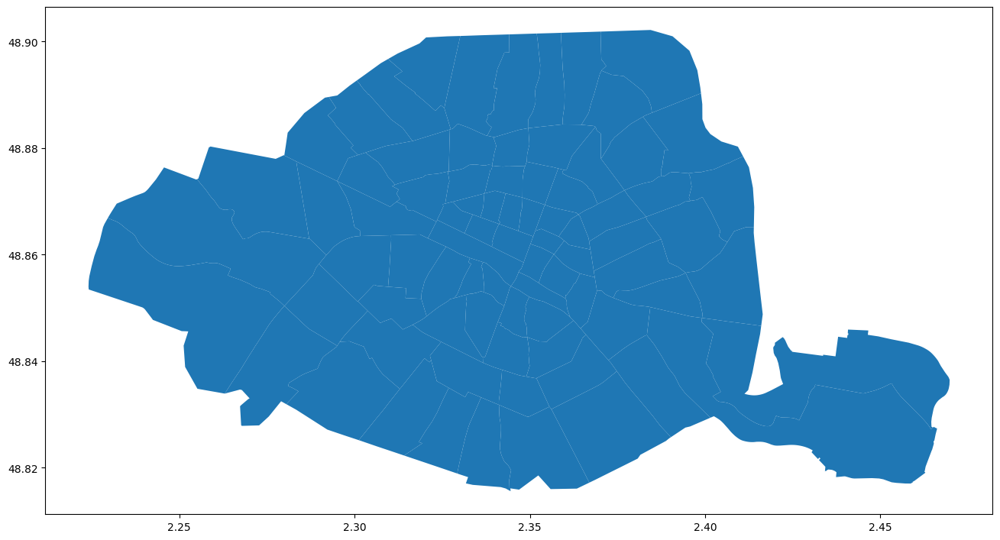

In [205]:
gdf_quartier["geometry"].plot(figsize=(16, 16))

In [206]:
gdf_addr_paris_1898 = geopandas.GeoDataFrame(
    ban_api_df, geometry=geopandas.points_from_xy(ban_api_df.longitude, ban_api_df.latitude))

In [207]:
gdf_addr_paris_1898

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet,longitude,latitude,result_score,result_score_next,result_label,result_type,result_id,result_housenumber,result_name,result_street,result_postcode,result_city,result_context,result_citycode,result_oldcitycode,result_oldcity,result_district,result_status,geometry
0,50475,277.0,M.277,M.277 MONTFAUCON (Impasse de) 76,MONTFAUCON,impasse,76,NaN,M,556.0,1072.0,4,NaN,NaN,Gros,NaN,NaN,Paris,quai,Jemmapes,74,NaN,NaN,NaN,['4'],1,4 impasse MONTFAUCON,4.755024,44.073959,0.701513,0.679722,4 Petite Impasse 30150 Montfaucon,housenumber,30178_0103_00004,4.0,4 Petite Impasse,Petite Impasse,30150,Montfaucon,"30, Gard, Occitanie",30178,NaN,NaN,NaN,ok,POINT (4.75502 44.07396)
1,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1,95 rue MIROMESNIL,2.315353,48.879746,0.829578,0.666718,95 Rue de Miromesnil 75008 Paris,housenumber,75108_6387_00095,95.0,95 Rue de Miromesnil,Rue de Miromesnil,75008,Paris,"75, Paris, Île-de-France",75108,NaN,NaN,Paris 8e Arrondissement,ok,POINT (2.31535 48.87975)
2,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1,34 avenue DAUMESNIL,2.375787,48.846897,0.984474,0.970043,34 Avenue Daumesnil 75012 Paris,housenumber,75112_2584_00034,34.0,34 Avenue Daumesnil,Avenue Daumesnil,75012,Paris,"75, Paris, Île-de-France",75112,NaN,NaN,Paris 12e Arrondissement,ok,POINT (2.37579 48.8469)
3,35944,53.0,H.53,H.53 HÉRISSON (Passage) 70,HÉRISSON,passage,70,NaN,H,397.0,913.0,19,NaN,NaN,Travé,NaN,NaN,Paris,pass.,Hérisson,19,NaN,NaN,NaN,['19'],1,19 passage HÉRISSON,0.625844,48.764458,0.690072,0.633795,Passage du Herisson 61300 L'Aigle,street,61214_0645,NaN,Passage du Herisson,Passage du Herisson,61300,L'Aigle,"61, Orne, Normandie",61214,NaN,NaN,NaN,ok,POINT (0.62584 48.76446)
4,4754,19.0,B.19,B.19 BALAGNY (Rue) 68,BALAGNY,rue,68,NaN,B,52.0,568.0,22,NaN,NaN,Floriet,NaN,NaN,Paris,boul.,Clichy,49,NaN,NaN,NaN,['22'],1,22 rue BALAGNY,2.490576,48.943805,0.806330,0.600745,22 Rue de Balagny 93600 Aulnay-sous-Bois,housenumber,93005_0280_00022,22.0,22 Rue de Balagny,Rue de Balagny,93600,Aulnay-sous-Bois,"93, Seine-Saint-Denis, Île-de-France",93005,NaN,NaN,NaN,ok,POINT (2.49058 48.9438)
5,13613,94.0,C.94,C.94 CENDRIERS (Rue des) 79,CENDRIERS,rue,79,NaN,C,149.0,665.0,14,NaN,NaN,Bray,NaN,NaN,Paris,r.,Cendriers,14,NaN,NaN,NaN,['14'],1,14 rue CENDRIERS,-0.077133,47.259589,0.849821,0.784556,14 Rue Cendrière 49400 Saumur,housenumber,49328_0410_00014,14.0,14 Rue Cendrière,Rue Cendrière,49400,Saumur,"49, Maine-et-Loire, Pays de la Loire",49328,49328.0,Saumur,NaN,ok,POINT (-0.07713 47.25959)
6,51569,319.0,M.319,M.319 MORILLONS (Rue des) 57,MORILLONS,rue,57,NaN,M,568.0,1084.0,33,NaN,NaN,Peignotel,NaN,NaN,Paris,boul.,Edgar Quinet,68,NaN,NaN,NaN,['33'],1,33 rue MORILLONS,2.175130,48.940560,0.780642,0.720898,33 Rue des Morillons 78500 Sartrouville,housenumber,78586_2310_00033,33.0,33 Rue des Morillons,Rue des Morillons,78500,Sartrouville,"78, Yvelines, Île-de-France",78586,NaN,NaN,NaN,ok,POINT (2.17513 48.94056)
7,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1,20 rue DUFRÉNOY,2.272961,48.866461,0.974586,0.518608,20 Rue Dufrenoy 75016 Paris,housenumber,75116_2962_00020,20.0,20 Rue Dufrenoy,Rue Dufrenoy,75016,Paris,"75, Paris, Île-de-France",75116,NaN,NaN,Paris 16e Arrondissement,ok,POINT (2.27296 48.86646)
8,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1,44 rue TOURTILLE,2.380090,48.872645,0.825466,0.477309,44 Rue de Tourtille 7502

###Gestion des systèmes de coordonnées et de projection

Rappel:
* Le système de coordonnées est la manière de définir la position d'un point sur la surface de la Terre.
* Le système de projection est la méthode pour projeter cette position sur une surface plane pour créer une carte.

In [210]:
gdf_addr_paris_1898.crs = "EPSG:4326"
gdf_quartier.crs = "EPSG:4326"

gdf_addr_paris_1898.to_crs("EPSG:3857")
gdf_quartier.to_crs("EPSG:3857")

,c_qu,c_quinsee,l_qu,c_ar,n_sq_ar,perimetre,surface,geometry
n_sq_qu,,,,,,,,
750000013.0,13.0,7510401.0,Saint-Merri,4.0,750000004.0,2346.004687,3.130404e+05,"POLYGON ((261892.848 6250278.054, 261878.189 6..."
750000016.0,16.0,7510404.0,Notre-Dame,4.0,750000004.0,3283.163371,3.782522e+05,"POLYGON ((262860.239 6249207.586, 262882.624 6..."
750000028.0,28.0,7510704.0,Gros-Caillou,7.0,750000007.0,4720.994373,1.381893e+06,"POLYGON ((257097.29 6250116.967, 256754.256 62..."
750000041.0,41.0,7511101.0,Folie-Méricourt,11.0,750000011.0,3724.352694,7.257525e+05,"POLYGON ((263838.62 6251776.642, 263482.224 62..."
750000007.0,7.0,7510203.0,Mail,2.0,750000002.0,2179.153605,2.781426e+05,"POLYGON ((261248.874 6251970.436, 261230.716 6..."
750000049.0,49.0,7511301.0,Salpêtrière,13.0,750000013.0,4759.096239,1.181560e+06,"POLYGON ((262309.18 6246240.679, 262285.177 62..."
750000008.0,8.0,7510204.0,Bonne-Nouvelle,2.0,750000002.0,2233.976030,2.814482e+05,"POLYGON ((261769.84 6251888.52, 261706.457 625..."
750000004.0,4.0,7510104.0,Place-Vendôme,1.0,750000001.0,2147.817602,2.694568e+05,"POLYGON ((259590.927 6251970.939, 259525.101 6..."
750000050.0,50.0,7511302.0,Gare,13.0,750000013.0,7070.350567,3.044178e+06,"POLYGON ((263571.863 6243938.183, 263488.851 6..."


In [211]:
# Vérifier s'il y a des géométries invalides
print("Géométries invalides quartier:", (~gdf_quartier.is_valid).sum())
print("Géométries invalides adresses:", (~gdf_addr_paris_1898.is_valid).sum())


Géométries invalides quartier: 0
Géométries invalides adresses: 0


### Projection des adresses sur un fond de carte de Paris

<Axes: >

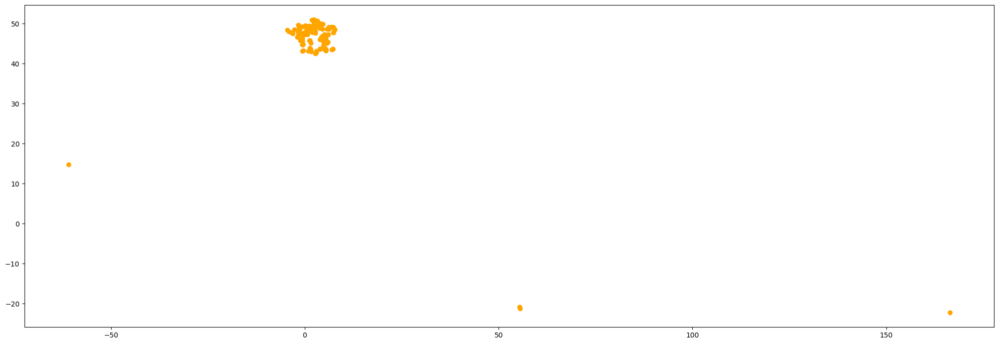

In [213]:
ax = gdf_quartier.plot(figsize = (25, 22), color='white', edgecolor='black')

gdf_addr_paris_1898.plot(ax = ax, color='orange')

### Relations spatiales et jointures des données

Les relations spatiales sont définies par l'OGC comme des prédicats binaires (intersects, contains, within, equals, ...) entre les différents types de géométries (point, lignes, polygones).
Voir toutes les combinaisons possibles dans ce tableau : https://docs.safe.com/fme/html/FME_Desktop_Documentation/FME_Transformers/Transformers/spatialrelations.htm

In [214]:
joined_df = geopandas.sjoin(
    gdf_addr_paris_1898,
    gdf_quartier,
    how='inner',
    predicate='intersects',
)
joined_df

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet,longitude,latitude,result_score,result_score_next,result_label,result_type,result_id,result_housenumber,result_name,result_street,result_postcode,result_city,result_context,result_citycode,result_oldcitycode,result_oldcity,result_district,result_status,geometry,n_sq_qu,c_qu,c_quinsee,l_qu,c_ar,n_sq_ar,perimetre,surface
1,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1,95 rue MIROMESNIL,2.315353,48.879746,0.829578,0.666718,95 Rue de Miromesnil 75008 Paris,housenumber,75108_6387_00095,95.0,95 Rue de Miromesnil,Rue de Miromesnil,75008,Paris,"75, Paris, Île-de-France",75108,NaN,NaN,Paris 8e Arrondissement,ok,POINT (2.31535 48.87975),750000032.0,32.0,7510804.0,Europe,8.0,750000008.0,4803.242769,1.182467e+06
2,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1,34 avenue DAUMESNIL,2.375787,48.846897,0.984474,0.970043,34 Avenue Daumesnil 75012 Paris,housenumber,75112_2584_00034,34.0,34 Avenue Daumesnil,Avenue Daumesnil,75012,Paris,"75, Paris, Île-de-France",75112,NaN,NaN,Paris 12e Arrondissement,ok,POINT (2.37579 48.8469),750000048.0,48.0,7511204.0,Quinze-Vingts,12.0,750000012.0,4509.486974,1.235916e+06
7,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1,20 rue DUFRÉNOY,2.272961,48.866461,0.974586,0.518608,20 Rue Dufrenoy 75016 Paris,housenumber,75116_2962_00020,20.0,20 Rue Dufrenoy,Rue Dufrenoy,75016,Paris,"75, Paris, Île-de-France",75116,NaN,NaN,Paris 16e Arrondissement,ok,POINT (2.27296 48.86646),750000063.0,63.0,7511603.0,Porte-Dauphine,16.0,750000016.0,7447.041546,3.086718e+06
8,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1,44 rue TOURTILLE,2.380090,48.872645,0.825466,0.477309,44 Rue de Tourtille 75020 Paris,housenumber,75120_9391_00044,44.0,44 Rue de Tourtille,Rue de Tourtille,75020,Paris,"75, Paris, Île-de-France",75120,NaN,NaN,Paris 20e Arrondissement,ok,POINT (2.38009 48.87264),750000077.0,77.0,7512001.0,Belleville,20.0,750000020.0,3738.454432,8.065686e+05
14,14783,157.0,C.157,C.157 CHAPON (Rue) 12,CHAPON,rue,12,NaN,C,161.0,677.0,52,NaN,NaN,NaN,Besombe et Robert,NaN,Paris,r.,St-Denis,156,NaN,NaN,NaN,['52'],1,52 rue CHAPON,2.353925,48.864065,0.969735,0.761975,52 Rue Chapon 75003 Paris,housenumber,75103_1771_00052,52.0,52 Rue Chapon,Rue Chapon,75003,Paris,"75, Paris, Île-de-France",75103,NaN,NaN,Paris 3e Arrondissement,ok,POINT (2.35392 48.86406),750000012.0,12.0,7510304.0,Sainte-Avoie,3.0,750000003.0,1861.804114,2.133164e+05
15,141,5.0,A.5,A.5 ABBÉ GROULT (Rue de l') 57-60,ABBÉ GROULT,rue,57-60,NaN,A,1.0,517.0,24,NaN,NaN,Sibilat,NaN,Mme,Paris,r.,Abbé Groult,24,NaN,NaN,NaN,['24'],1,24 rue ABBÉ GROULT,2.294236,48.842019,0.776474,0.474257,24 Rue de l'Abbé Groult 75015 Paris,housenumber,75115_0012_00024,24.0,24 Rue de l'Abbé Groult,Rue de l'Abbé Groult,75015,Paris,"75, Paris, Île-de-France",75115,NaN,NaN,Paris 15e Arrondissement,ok,POINT (2.29424 48.84202),750000057.0,57.0,7511501.0,Saint-Lambert,15.0,750000015.0,6928.792072,2.829202e+06
16,47945,154.0,M.154,M.154 MAZARINE (Rue) 21,MAZARINE,rue,21,NaN,M,528.0,1044.0,31,NaN,NaN,NaN,Portefin et Desroque,NaN,Paris,pl.,Dauphine,12,gér. Ferragus,NaN,NaN,['31'],1,31 rue MAZARINE,2.338114,48.854567,0.971559,0.917336,31 Rue Mazarine 75006 Paris,housenumber,75106_6228_00031,31.0,31 Rue Mazarine,Rue Mazarine,75006,Paris,"75, Paris, Île-de-France",75106,NaN,NaN,Paris 6e Arrondissement,ok,POINT (2.33811 48.85457),750000021.0,21.0,7510601.0,Monnaie,6.0,7500

In [215]:
non_match_addr = geopandas.sjoin(
    gdf_addr_paris_1898,
    gdf_quartier,
    how='left',
    predicate='intersects',
)
non_match_addr

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet,longitude,latitude,result_score,result_score_next,result_label,result_type,result_id,result_housenumber,result_name,result_street,result_postcode,result_city,result_context,result_citycode,result_oldcitycode,result_oldcity,result_district,result_status,geometry,n_sq_qu,c_qu,c_quinsee,l_qu,c_ar,n_sq_ar,perimetre,surface
0,50475,277.0,M.277,M.277 MONTFAUCON (Impasse de) 76,MONTFAUCON,impasse,76,NaN,M,556.0,1072.0,4,NaN,NaN,Gros,NaN,NaN,Paris,quai,Jemmapes,74,NaN,NaN,NaN,['4'],1,4 impasse MONTFAUCON,4.755024,44.073959,0.701513,0.679722,4 Petite Impasse 30150 Montfaucon,housenumber,30178_0103_00004,4.0,4 Petite Impasse,Petite Impasse,30150,Montfaucon,"30, Gard, Occitanie",30178,NaN,NaN,NaN,ok,POINT (4.75502 44.07396),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1,95 rue MIROMESNIL,2.315353,48.879746,0.829578,0.666718,95 Rue de Miromesnil 75008 Paris,housenumber,75108_6387_00095,95.0,95 Rue de Miromesnil,Rue de Miromesnil,75008,Paris,"75, Paris, Île-de-France",75108,NaN,NaN,Paris 8e Arrondissement,ok,POINT (2.31535 48.87975),750000032.0,32.0,7510804.0,Europe,8.0,750000008.0,4803.242769,1.182467e+06
2,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1,34 avenue DAUMESNIL,2.375787,48.846897,0.984474,0.970043,34 Avenue Daumesnil 75012 Paris,housenumber,75112_2584_00034,34.0,34 Avenue Daumesnil,Avenue Daumesnil,75012,Paris,"75, Paris, Île-de-France",75112,NaN,NaN,Paris 12e Arrondissement,ok,POINT (2.37579 48.8469),750000048.0,48.0,7511204.0,Quinze-Vingts,12.0,750000012.0,4509.486974,1.235916e+06
3,35944,53.0,H.53,H.53 HÉRISSON (Passage) 70,HÉRISSON,passage,70,NaN,H,397.0,913.0,19,NaN,NaN,Travé,NaN,NaN,Paris,pass.,Hérisson,19,NaN,NaN,NaN,['19'],1,19 passage HÉRISSON,0.625844,48.764458,0.690072,0.633795,Passage du Herisson 61300 L'Aigle,street,61214_0645,NaN,Passage du Herisson,Passage du Herisson,61300,L'Aigle,"61, Orne, Normandie",61214,NaN,NaN,NaN,ok,POINT (0.62584 48.76446),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4754,19.0,B.19,B.19 BALAGNY (Rue) 68,BALAGNY,rue,68,NaN,B,52.0,568.0,22,NaN,NaN,Floriet,NaN,NaN,Paris,boul.,Clichy,49,NaN,NaN,NaN,['22'],1,22 rue BALAGNY,2.490576,48.943805,0.806330,0.600745,22 Rue de Balagny 93600 Aulnay-sous-Bois,housenumber,93005_0280_00022,22.0,22 Rue de Balagny,Rue de Balagny,93600,Aulnay-sous-Bois,"93, Seine-Saint-Denis, Île-de-France",93005,NaN,NaN,NaN,ok,POINT (2.49058 48.9438),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,13613,94.0,C.94,C.94 CENDRIERS (Rue des) 79,CENDRIERS,rue,79,NaN,C,149.0,665.0,14,NaN,NaN,Bray,NaN,NaN,Paris,r.,Cendriers,14,NaN,NaN,NaN,['14'],1,14 rue CENDRIERS,-0.077133,47.259589,0.849821,0.784556,14 Rue Cendrière 49400 Saumur,housenumber,49328_0410_00014,14.0,14 Rue Cendrière,Rue Cendrière,49400,Saumur,"49, Maine-et-Loire, Pays de la Loire",49328,49328.0,Saumur,NaN,ok,POINT (-0.07713 47.25959),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,51569,319.0,M.319,M.319 MORILLONS (Rue des) 57,MORILLONS,rue,57,NaN,M,568.0,1084.0,33,NaN,NaN,Peignotel,NaN,NaN,Paris,boul.,Edgar Quinet,68,NaN,NaN,NaN,['33'],1,33 rue MORILLONS,2.175130,48.940560,0.780642,0.720898,33 Rue des Morillons 78500 Sartrouville,housenumber,78586_2310_00033,33.0,33 Rue des Morillons,Rue des Morillons,78500,Sartrouville,"78, Yvelines, Île-de-France",78586,NaN,NaN,NaN,ok,POINT (2.17513 48.94056),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1,20 rue DUFRÉNOY,2.272961,48.866461,0.974586,0.518608,20 Rue Dufrenoy 75016 Paris,housenumber,75116_29

In [216]:
non_match_addr.isnull().sum()

,0
nOrder,0
num_voie,0
code_voie,0
code_voie_quartier,0
nom_voie,0
type_voie,0
quartiers,0
voie_fantome,667
lettre,0
pdf,0


### Première analyse : combien d'adresses par quartier ?

In [217]:
count_addr_per_quartier = joined_df.groupby(['n_sq_ar'],
    as_index=False,
)['addr_complet'].count()
count_addr_per_quartier.columns = ['n_sq_ar', 'count_addr']
count_addr_per_quartier

,n_sq_ar,count_addr
0,750000001.0,7
1,750000002.0,9
2,750000003.0,11
3,750000004.0,9
4,750000005.0,7
5,750000006.0,7
6,750000007.0,14
7,750000008.0,17
8,750000009.0,15
9,750000010.0,21


**Jointure à gauche des tableurs : nombre de point par quartier**

In [222]:
addr_count_quartier = gdf_quartier.merge(
    count_addr_per_quartier,
    on='n_sq_ar',
    how='left',
)
addr_count_quartier.head()

,c_qu,c_quinsee,l_qu,c_ar,n_sq_ar,perimetre,surface,geometry,count_addr
0,13.0,7510401.0,Saint-Merri,4.0,750000004.0,2346.004687,3.130404e+05,"POLYGON ((2.35262 48.85491, 2.35249 48.85467, ...",9
1,16.0,7510404.0,Notre-Dame,4.0,750000004.0,3283.163371,3.782522e+05,"POLYGON ((2.36131 48.84858, 2.36151 48.84823, ...",9
2,28.0,7510704.0,Gros-Caillou,7.0,750000007.0,4720.994373,1.381893e+06,"POLYGON ((2.30954 48.85396, 2.30646 48.85413, ...",14
3,41.0,7511101.0,Folie-Méricourt,11.0,750000011.0,3724.352694,7.257525e+05,"POLYGON ((2.3701 48.86376, 2.3669 48.86246, 2....",15
4,7.0,7510203.0,Mail,2.0,750000002.0,2179.153605,2.781426e+05,"POLYGON ((2.34684 48.86491, 2.34668 48.86443, ...",9


In [223]:
addr_count_quartier.isnull().sum()

,0
c_qu,0
c_quinsee,0
l_qu,0
c_ar,0
n_sq_ar,0
perimetre,0
surface,0
geometry,0
count_addr,0


In [220]:
addr_count_quartier['count_addr'].fillna(
    0,
    inplace=True,
)
# fill in missing's with 0, valid in this case.

/tmp/ipython-input-2594356162.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  addr_count_quartier['count_addr'].fillna(


In [221]:
addr_count_quartier

,c_qu,c_quinsee,l_qu,c_ar,n_sq_ar,perimetre,surface,geometry,count_addr
0,13.0,7510401.0,Saint-Merri,4.0,750000004.0,2346.004687,3.130404e+05,"POLYGON ((2.35262 48.85491, 2.35249 48.85467, ...",9
1,16.0,7510404.0,Notre-Dame,4.0,750000004.0,3283.163371,3.782522e+05,"POLYGON ((2.36131 48.84858, 2.36151 48.84823, ...",9
2,28.0,7510704.0,Gros-Caillou,7.0,750000007.0,4720.994373,1.381893e+06,"POLYGON ((2.30954 48.85396, 2.30646 48.85413, ...",14
3,41.0,7511101.0,Folie-Méricourt,11.0,750000011.0,3724.352694,7.257525e+05,"POLYGON ((2.3701 48.86376, 2.3669 48.86246, 2....",15
4,7.0,7510203.0,Mail,2.0,750000002.0,2179.153605,2.781426e+05,"POLYGON ((2.34684 48.86491, 2.34668 48.86443, ...",9
5,49.0,7511301.0,Salpêtrière,13.0,750000013.0,4759.096239,1.181560e+06,"POLYGON ((2.35636 48.83104, 2.35615 48.83097, ...",22
6,8.0,7510204.0,Bonne-Nouvelle,2.0,750000002.0,2233.976030,2.814482e+05,"POLYGON ((2.35152 48.86443, 2.35095 48.86341, ...",9
7,4.0,7510104.0,Place-Vendôme,1.0,750000001.0,2147.817602,2.694568e+05,"POLYGON ((2.33194 48.86491, 2.33135 48.86399, ...",7
8,50.0,7511302.0,Gare,13.0,750000013.0,7070.350567,3.044178e+06,"POLYGON ((2.36771 48.81742, 2.36696 48.81719, ...",22
9,76.0,7511904.0,Combat,19.0,750000019.0,4435.273252,1.294988e+06,"POLYGON ((2.38834 48.88057, 2.3895 48.87955, 2...",18


###Cartographie thématique

**Carte cercles proportionnels - stock**

/tmp/ipython-input-191047548.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = addr_count_quartier.geometry.centroid


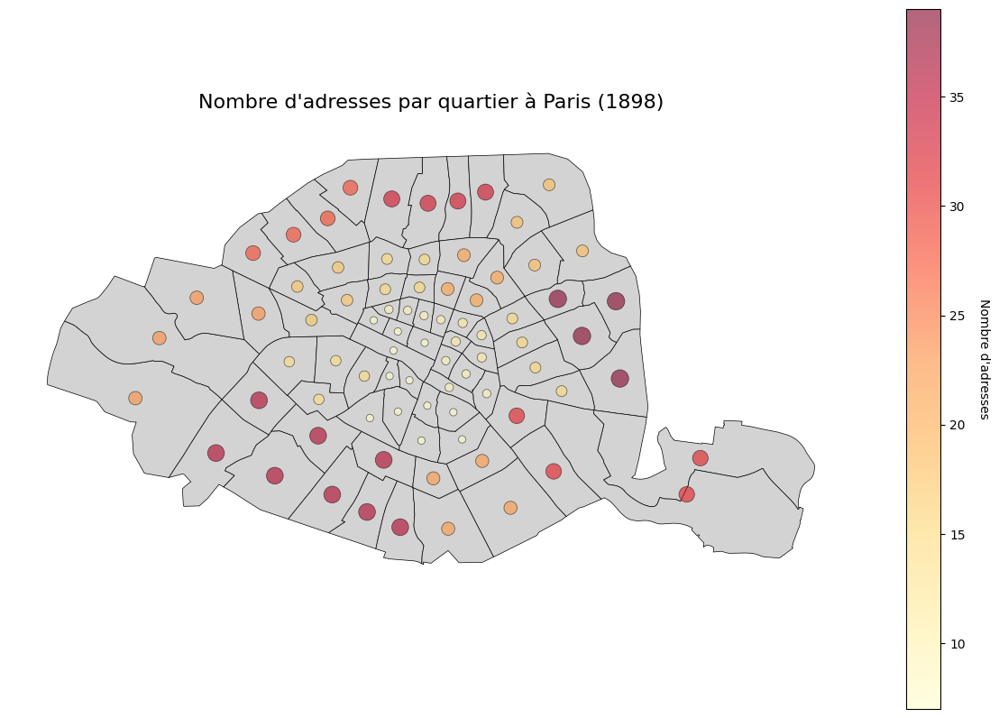

In [224]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Fond : quartiers
addr_count_quartier.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Calculer les centroïdes pour positionner les cercles
centroids = addr_count_quartier.geometry.centroid

# Cercles proportionnels
scatter = ax.scatter(
    centroids.x,
    centroids.y,
    s=addr_count_quartier['count_addr'] * 5,  # Taille proportionnelle (ajustez le multiplicateur)
    c=addr_count_quartier['count_addr'],       # Couleur selon le nombre
    cmap='YlOrRd',                   # Palette de couleurs
    alpha=0.6,
    edgecolors='black',
    linewidth=0.5
)

# Ajouter une légende de couleur
cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
cbar.set_label('Nombre d\'adresses', rotation=270, labelpad=20)

plt.title('Nombre d\'adresses par quartier à Paris (1898)', fontsize=16, pad=20)
plt.axis('off')

plt.tight_layout()
plt.show()

**Carte choroplèthe - rapport**

In [225]:
print(addr_count_quartier.crs)

EPSG:4326


In [226]:
addr_count_quartier = addr_count_quartier.to_crs(epsg=2154)

In [227]:
print(addr_count_quartier.crs)

EPSG:2154


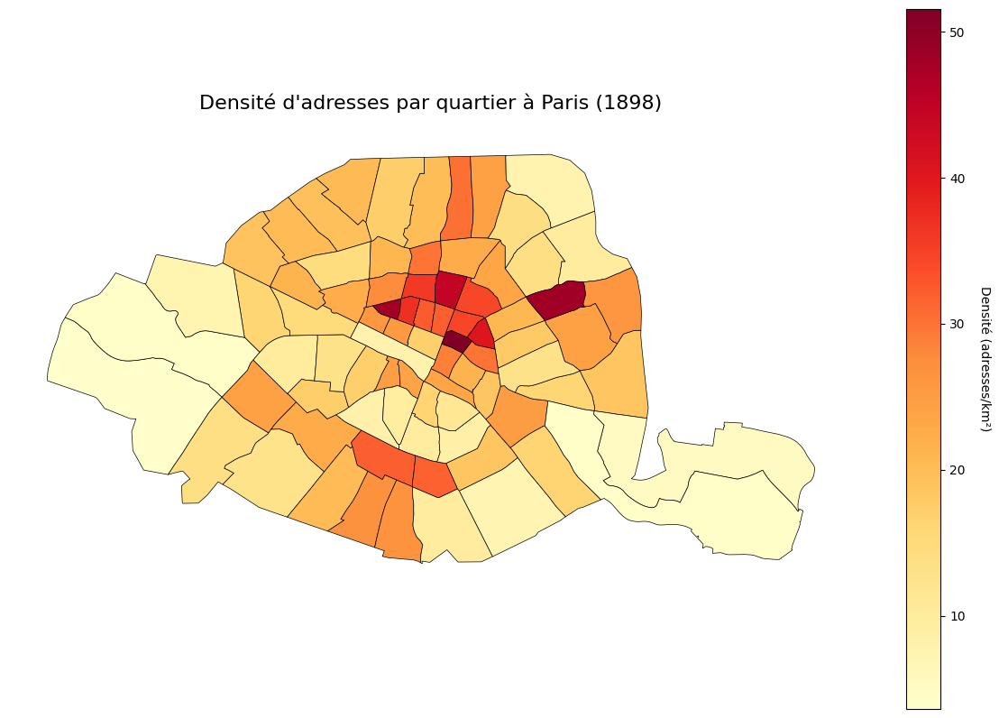

In [228]:
import matplotlib.pyplot as plt

# Calculer la superficie en km²
addr_count_quartier['superficie_km2'] = addr_count_quartier.geometry.area / 1_000_000

# Calculer la densité d'adresses par km²
addr_count_quartier['densite_km2'] = addr_count_quartier['count_addr'] / addr_count_quartier['superficie_km2']

# Carte choroplèthe
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

addr_count_quartier.plot(
    ax=ax,
    column='densite_km2',
    cmap='YlOrRd',
    legend=True,
    edgecolor='black',
    linewidth=0.5,
    legend_kwds={'shrink': 0.8}
)

# Ajouter manuellement le label de la légende
cbar = ax.get_figure().axes[-1]  # Récupérer l'axe de la colorbar
cbar.set_ylabel('Densité (adresses/km²)', rotation=270, labelpad=20)

plt.title('Densité d\'adresses par quartier à Paris (1898)', fontsize=16, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

###Méthodes de classification

In [229]:
!pip install mapclassify

In [230]:
addr_count_quartier['count_addr'].describe()

# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html

,count_addr
count,80.000000
mean,19.900000
std,10.481569
min,7.000000
25%,10.500000
50%,17.500000
75%,28.750000
max,39.000000


*   Quantiles
*   BoxPlot
*   EqualInterval
*   NaturalBreaks
*   Percentiles
*   *Jenks
*   StdMean



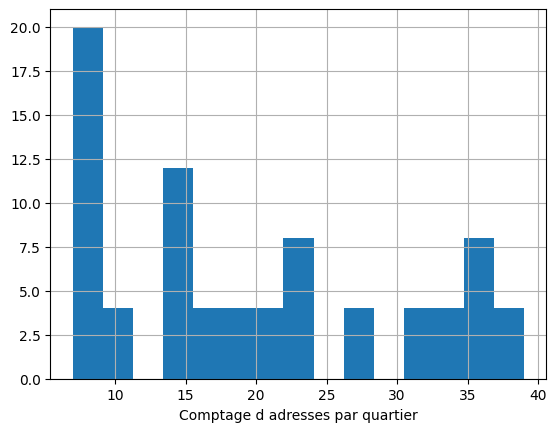

In [231]:
import matplotlib.pyplot as plt

addr_count_quartier['count_addr'].hist(bins=15)
plt.xlabel('Comptage d adresses par quartier')
plt.show()

**EQUAL INTERVAL** divise les données en classes de taille égale (par exemple, 0-10, 10-20, 20-30, etc.) et fonctionne mieux avec des données qui sont généralement réparties sur toute la plage.

ATTENTION : évitez l'intervalle égal si vos données tendent à une extrémité ou si vous avez une ou deux valeurs aberrantes vraiment importantes.

In [232]:
import mapclassify

mapclassify.EqualInterval(addr_count_quartier.count_addr, k=5)

EqualInterval

   Interval      Count
----------------------
[ 7.00, 13.40] |    24
(13.40, 19.80] |    20
(19.80, 26.20] |    12
(26.20, 32.60] |     8
(32.60, 39.00] |    16

**QUANTILES** essaie de classer le même nombre d'observations dans chacune des N classes. En d'autres termes, cette méthode essaie d'organiser les groupes de façon à ce qu'ils aient la même quantité. Le problème avec les quantiles est que vous pouvez vous retrouver avec des classes qui ont des plages numériques très différentes (par exemple, 1-4, 4-9, 9-250).

In [233]:
mapclassify.Quantiles(addr_count_quartier.count_addr, k=5)

Quantiles

   Interval      Count
----------------------
[ 7.00,  9.00] |    20
( 9.00, 15.00] |    16
(15.00, 21.40] |    12
(21.40, 31.40] |    16
(31.40, 39.00] |    16

**NATURAL BREAKS (Jenks)** organise chaque groupe de manière à ce qu'il y ait moins de variation dans chaque classe ou nuance.

est une sorte de schéma de classification "optimal" qui trouve les ruptures de classe qui minimiseront la variance intra-classe et maximiseront les différences entre les classes. Un inconvénient de cette approche est que chaque ensemble de données génère une solution de classification unique, et si vous avez besoin de faire des comparaisons entre les cartes, comme dans un atlas ou une série (par exemple, une carte pour 1980, 1990, 2000), vous voudrez peut-être utiliser un seul schéma qui peut être appliqué à toutes les cartes.



In [234]:
mapclassify.NaturalBreaks(addr_count_quartier.count_addr)

NaturalBreaks

   Interval      Count
----------------------
[ 7.00, 11.00] |    24
(11.00, 18.00] |    20
(18.00, 23.00] |    12
(23.00, 33.00] |    12
(33.00, 39.00] |    12

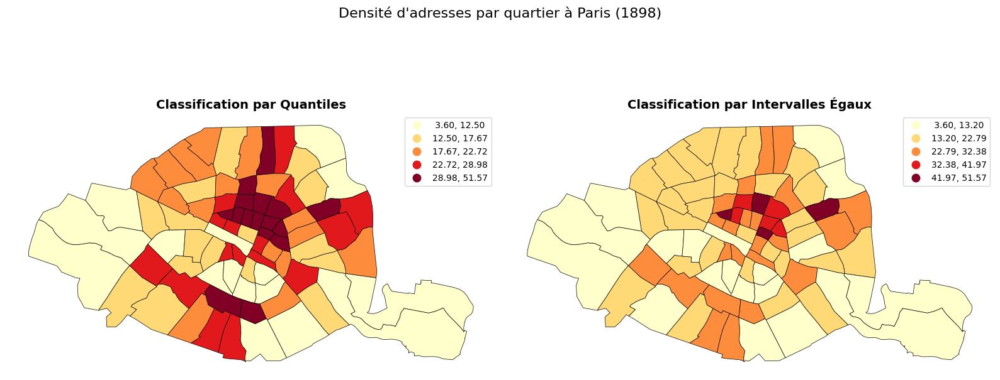

In [235]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Quantiles
addr_count_quartier.plot(
    ax=axes[0],
    column='densite_km2',
    cmap='YlOrRd',
    scheme='quantiles',
    k=5,
    legend=True,
    edgecolor='black',
    linewidth=0.5
)
axes[0].set_title('Classification par Quantiles', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Intervalles égaux
addr_count_quartier.plot(
    ax=axes[1],
    column='densite_km2',
    cmap='YlOrRd',
    scheme='equal_interval',
    k=5,
    legend=True,
    edgecolor='black',
    linewidth=0.5
)
axes[1].set_title('Classification par Intervalles Égaux', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.suptitle('Densité d\'adresses par quartier à Paris (1898)', fontsize=16, y=0.95)
plt.tight_layout()
plt.show()

Pour plus d'informations : https://gisgeography.com/choropleth-maps-data-classification/

In [236]:
bp = mapclassify.Quantiles(addr_count_quartier.count_addr)
bp

Quantiles

   Interval      Count
----------------------
[ 7.00,  9.00] |    20
( 9.00, 15.00] |    16
(15.00, 21.40] |    12
(21.40, 31.40] |    16
(31.40, 39.00] |    16

In [237]:
addr_count_quartier.explore("count_addr", legend=True)

### Une autre analyse : identifier et cartographier les 10 principaux propriétaires

In [239]:
len(gdf_addr_paris_1898)

667

In [240]:
gdf_addr_paris_1898

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet,longitude,latitude,result_score,result_score_next,result_label,result_type,result_id,result_housenumber,result_name,result_street,result_postcode,result_city,result_context,result_citycode,result_oldcitycode,result_oldcity,result_district,result_status,geometry
0,50475,277.0,M.277,M.277 MONTFAUCON (Impasse de) 76,MONTFAUCON,impasse,76,NaN,M,556.0,1072.0,4,NaN,NaN,Gros,NaN,NaN,Paris,quai,Jemmapes,74,NaN,NaN,NaN,['4'],1,4 impasse MONTFAUCON,4.755024,44.073959,0.701513,0.679722,4 Petite Impasse 30150 Montfaucon,housenumber,30178_0103_00004,4.0,4 Petite Impasse,Petite Impasse,30150,Montfaucon,"30, Gard, Occitanie",30178,NaN,NaN,NaN,ok,POINT (4.75502 44.07396)
1,49292,227.0,M.227,M.227 MIROMESNIL (Rue de) 31-32,MIROMESNIL,rue,31-32,NaN,M,543.0,1059.0,95,NaN,NaN,Lalou,NaN,NaN,Paris,r.,Miromesnil,95,NaN,NaN,NaN,['95'],1,95 rue MIROMESNIL,2.315353,48.879746,0.829578,0.666718,95 Rue de Miromesnil 75008 Paris,housenumber,75108_6387_00095,95.0,95 Rue de Miromesnil,Rue de Miromesnil,75008,Paris,"75, Paris, Île-de-France",75108,NaN,NaN,Paris 8e Arrondissement,ok,POINT (2.31535 48.87975)
2,22043,36.0,D.36,D.36 DAUMESNIL (Avenue) 45-46-47-48,DAUMESNIL,avenue,45-46-47-48,NaN,D,241.0,757.0,34,NaN,NaN,Hatterer,NaN,NaN,Paris,r.,Cl. Tillier,15,NaN,NaN,NaN,['34'],1,34 avenue DAUMESNIL,2.375787,48.846897,0.984474,0.970043,34 Avenue Daumesnil 75012 Paris,housenumber,75112_2584_00034,34.0,34 Avenue Daumesnil,Avenue Daumesnil,75012,Paris,"75, Paris, Île-de-France",75112,NaN,NaN,Paris 12e Arrondissement,ok,POINT (2.37579 48.8469)
3,35944,53.0,H.53,H.53 HÉRISSON (Passage) 70,HÉRISSON,passage,70,NaN,H,397.0,913.0,19,NaN,NaN,Travé,NaN,NaN,Paris,pass.,Hérisson,19,NaN,NaN,NaN,['19'],1,19 passage HÉRISSON,0.625844,48.764458,0.690072,0.633795,Passage du Herisson 61300 L'Aigle,street,61214_0645,NaN,Passage du Herisson,Passage du Herisson,61300,L'Aigle,"61, Orne, Normandie",61214,NaN,NaN,NaN,ok,POINT (0.62584 48.76446)
4,4754,19.0,B.19,B.19 BALAGNY (Rue) 68,BALAGNY,rue,68,NaN,B,52.0,568.0,22,NaN,NaN,Floriet,NaN,NaN,Paris,boul.,Clichy,49,NaN,NaN,NaN,['22'],1,22 rue BALAGNY,2.490576,48.943805,0.806330,0.600745,22 Rue de Balagny 93600 Aulnay-sous-Bois,housenumber,93005_0280_00022,22.0,22 Rue de Balagny,Rue de Balagny,93600,Aulnay-sous-Bois,"93, Seine-Saint-Denis, Île-de-France",93005,NaN,NaN,NaN,ok,POINT (2.49058 48.9438)
5,13613,94.0,C.94,C.94 CENDRIERS (Rue des) 79,CENDRIERS,rue,79,NaN,C,149.0,665.0,14,NaN,NaN,Bray,NaN,NaN,Paris,r.,Cendriers,14,NaN,NaN,NaN,['14'],1,14 rue CENDRIERS,-0.077133,47.259589,0.849821,0.784556,14 Rue Cendrière 49400 Saumur,housenumber,49328_0410_00014,14.0,14 Rue Cendrière,Rue Cendrière,49400,Saumur,"49, Maine-et-Loire, Pays de la Loire",49328,49328.0,Saumur,NaN,ok,POINT (-0.07713 47.25959)
6,51569,319.0,M.319,M.319 MORILLONS (Rue des) 57,MORILLONS,rue,57,NaN,M,568.0,1084.0,33,NaN,NaN,Peignotel,NaN,NaN,Paris,boul.,Edgar Quinet,68,NaN,NaN,NaN,['33'],1,33 rue MORILLONS,2.175130,48.940560,0.780642,0.720898,33 Rue des Morillons 78500 Sartrouville,housenumber,78586_2310_00033,33.0,33 Rue des Morillons,Rue des Morillons,78500,Sartrouville,"78, Yvelines, Île-de-France",78586,NaN,NaN,NaN,ok,POINT (2.17513 48.94056)
7,24488,179.0,D.179,D.179 DUFRÉNOY (Rue) 63,DUFRÉNOY,rue,63,NaN,D,269.0,785.0,20,NaN,NaN,Trouard-Riolle,NaN,NaN,Paris,av.,Kléber,21,NaN,NaN,NaN,['20'],1,20 rue DUFRÉNOY,2.272961,48.866461,0.974586,0.518608,20 Rue Dufrenoy 75016 Paris,housenumber,75116_2962_00020,20.0,20 Rue Dufrenoy,Rue Dufrenoy,75016,Paris,"75, Paris, Île-de-France",75116,NaN,NaN,Paris 16e Arrondissement,ok,POINT (2.27296 48.86646)
8,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1,44 rue TOURTILLE,2.380090,48.872645,0.825466,0.477309,44 Rue de Tourtille 7502

In [241]:
# Compter le nombre de propriétés par propriétaire
proprietaire_count = gdf_addr_paris_1898['PERS'].value_counts()
proprietaire_count


,count
PERS,
Marchand,4
Laurent,3
Ribot,3
Lefebvre,3
Dubois,3
Michel,3
Pernet,2
Renoult,2
Marguerite,2


In [242]:
# Compter le nombre de propriétés(org) par propriétaire
org_prop_count = gdf_addr_paris_1898['ORG'].value_counts()
org_prop_count

,count
ORG,
Besombe et Robert,1
Portefin et Desroque,1
Bouchot et Lemaire,1
Galland et Delaunay,1
Cie Ass. Vie « Le Monde »,1
Société Civile,1
« Immeubles de France »,1
Cie Ass. Vie « La Foncière »,1
Th,1


In [243]:
# Afficher les propriétaires avec le plus de propriétés
top_proprietaires = proprietaire_count.head(10).index  # afficher les 10 premiers par exemple
print(top_proprietaires)


Index(['Marchand', 'Laurent', 'Ribot', 'Lefebvre', 'Dubois', 'Michel',
       'Pernet', 'Renoult', 'Marguerite', 'Aubert'],
      dtype='object', name='PERS')


In [244]:
gdf_addr_paris_1898_top_prop = gdf_addr_paris_1898[gdf_addr_paris_1898['PERS'].isin(top_proprietaires)]

In [245]:
gdf_addr_paris_1898_top_prop

,nOrder,num_voie,code_voie,code_voie_quartier,nom_voie,type_voie,quartiers,voie_fantome,lettre,pdf,pagination,NUM,NUM_GLOB,PART,PERS,ORG,STATUT,VILLE,VOIE,RUE,NUM_PERS,GER,LOC,SPATIAL,Liste_imm,Nb_imm,addr_complet,longitude,latitude,result_score,result_score_next,result_label,result_type,result_id,result_housenumber,result_name,result_street,result_postcode,result_city,result_context,result_citycode,result_oldcitycode,result_oldcity,result_district,result_status,geometry
8,76694,114.0,T.114,T.114 TOURTILLE (Rue de) 77,TOURTILLE,rue,77,NaN,T,846.0,1362.0,44,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Marais,50,NaN,NaN,NaN,['44'],1,44 rue TOURTILLE,2.380090,48.872645,0.825466,0.477309,44 Rue de Tourtille 75020 Paris,housenumber,75120_9391_00044,44.0,44 Rue de Tourtille,Rue de Tourtille,75020,Paris,"75, Paris, Île-de-France",75120,NaN,NaN,Paris 20e Arrondissement,ok,POINT (2.38009 48.87264)
28,47953,154.0,M.154,M.154 MAZARINE (Rue) 21,MAZARINE,rue,21,NaN,M,528.0,1044.0,49,NaN,NaN,Lefebvre,NaN,Mme,Paris,r.,Mazarine,49,NaN,NaN,NaN,['49'],1,49 rue MAZARINE,2.338396,48.853920,0.971559,0.913752,49 Rue Mazarine 75006 Paris,housenumber,75106_6228_00049,49.0,49 Rue Mazarine,Rue Mazarine,75006,Paris,"75, Paris, Île-de-France",75106,NaN,NaN,Paris 6e Arrondissement,ok,POINT (2.3384 48.85392)
110,39314,5.0,L.5,L.5 LABIE (Rue) 65,LABIE,rue,65,NaN,L,433.0,949.0,8,NaN,NaN,Aubert,NaN,NaN,Paris,r.,La Boëtie,8,NaN,NaN,NaN,['8'],1,8 rue LABIE,2.288374,48.879415,0.972216,0.688252,8 Rue Labie 75017 Paris,housenumber,75117_5192_00008,8.0,8 Rue Labie,Rue Labie,75017,Paris,"75, Paris, Île-de-France",75117,NaN,NaN,Paris 17e Arrondissement,ok,POINT (2.28837 48.87942)
125,20902,446.0,C.446,C.446 CROIX-NIVERT (Rue de la) 57-58-59-60,CROIX-NIVERT,rue,57-58-59-60,NaN,C,228.0,744.0,219,NaN,NaN,Laurent,NaN,NaN,Paris,r.,Lecourbe,189,NaN,NaN,NaN,['219'],1,219 rue CROIX-NIVERT,2.289782,48.835978,0.767014,0.521538,219 Rue de la Croix Nivert 75015 Paris,housenumber,75115_2459_00219,219.0,219 Rue de la Croix Nivert,Rue de la Croix Nivert,75015,Paris,"75, Paris, Île-de-France",75115,NaN,NaN,Paris 15e Arrondissement,ok,POINT (2.28978 48.83598)
150,10001,280.0,B.280,B.280 BOUDIN (Passage) 78,BOUDIN,passage,78,NaN,B,109.0,625.0,18,NaN,NaN,Michel,NaN,NaN,Paris,fg,Temple,26,NaN,NaN,NaN,['18'],1,18 passage BOUDIN,2.407080,48.869057,0.974437,0.396541,18 Passage Boudin 75020 Paris,housenumber,75120_1141_00018,18.0,18 Passage Boudin,Passage Boudin,75020,Paris,"75, Paris, Île-de-France",75120,NaN,NaN,Paris 20e Arrondissement,ok,POINT (2.40708 48.86906)
203,8836,225.0,B.225,B.225 BLONDEL (Rue) 8_9,BLONDEL,rue,8-9,NaN,B,96.0,612.0,16,NaN,NaN,Marchand,NaN,NaN,Paris,r.,Amsterdam,87,NaN,NaN,NaN,['16'],1,16 rue BLONDEL,4.026935,49.269548,0.975596,0.973869,16 Rue Blondel 51100 Reims,housenumber,51454_0970_00016,16.0,16 Rue Blondel,Rue Blondel,51100,Reims,"51, Marne, Grand Est",51454,NaN,NaN,NaN,ok,POINT (4.02694 49.26955)
227,73212,275.0,S.275,S.275 SIMON-LE-FRANC (Rue) 13,SIMON-LE-FRANC,rue,13,NaN,S,808.0,1324.0,19,NaN,NaN,Dubois,NaN,NaN,Paris,r.,Simon-le- Franc,19,gér. Bertin,NaN,NaN,['19'],1,19 rue SIMON-LE-FRANC,2.353717,48.860091,0.826888,NaN,Rue Simon Le Franc 75004 Paris,street,75104_8984,NaN,Rue Simon Le Franc,Rue Simon Le Franc,75004,Paris,"75, Paris, Île-de-France",75104,NaN,NaN,Paris 4e Arrondissement,ok,POINT (2.35372 48.86009)
247,44353,233.0,L.233,L.233 LONGCHAMP (Rue de) 63-64,LONGCHAMP,rue,63-64,NaN,L,487.0,1003.0,146,NaN,NaN,Marchand,NaN,NaN,Paris,quai,Rapée,100,NaN,NaN,NaN,['146'],1,146 rue LONGCHAMP,2.276748,48.867792,0.838198,0.746194,146 Rue de Longchamp 75016 Paris,housenumber,75116_5744_00146,146.0,146 Rue de Longchamp,Rue de Longchamp,75016,Paris,"75, Paris, Île-de-France",75116,NaN,NaN,Paris 16e Arrondissement,ok,POINT (2.27675 48.86779)
252,32865,95.0,G.95,G.95 GLACIÈRE (Rue de la) 51-52-54,GLACIÈRE,rue,51-52-54,NaN,G,361.0,877.0,112,NaN,NaN,Marchand,NaN,NaN,Paris,av.,Ledru Rollin,26,NaN,NaN,NaN,['112'],1,112 rue GLACIÈRE,2.342679,48.828625,0.722017,0.712763,112 Rue de l

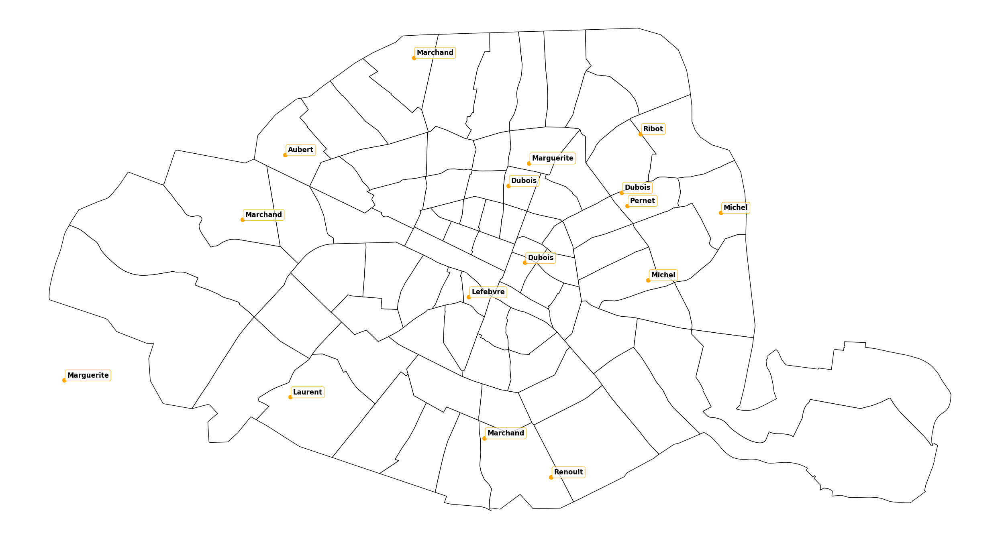

In [250]:
bbox = gdf_quartier.total_bounds
gdf_addr_filtered = gdf_addr_paris_1898_top_prop.cx[bbox[0]:bbox[2], bbox[1]:bbox[3]]

ax = gdf_quartier.plot(figsize=(25, 22), color='white', edgecolor='black')
gdf_addr_filtered.plot(ax=ax, color='orange', markersize=50)

# Ajouter les étiquettes avec style personnalisé
for idx, row in gdf_addr_filtered.iterrows():
    ax.annotate(
        text=row['PERS'],
        xy=(row.geometry.x, row.geometry.y),
        xytext=(5, 5),
        textcoords='offset points',
        fontsize=12,
        color='black',
        weight='bold',
        ha='left',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='orange', alpha=0.7)
    )

plt.axis('off')
plt.tight_layout()
plt.show()